In [1]:
# importing necessary libraries and configurations
import pandas as pd
import matplotlib.pyplot as plt

from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot

plt.style.use("fivethirtyeight") 
%matplotlib inline

In [2]:
# loading the data set
df = pd.read_csv("df_05.csv")

In [3]:
# data cleaning and indexing 
df.drop("zip_code", axis=1, inplace=True)

df.occurred_date_time = df.occurred_date_time.astype("datetime64")
df.set_index(["occurred_date_time"], inplace=True)
df.sort_index(inplace=True)

# examining the new data frame
display(df.head())
display(df.tail())

,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,latitude,longitude,year,month,week,day,hour
occurred_date_time,,,,,,,,,,,,,,,,,
2003-01-01 00:01:00,BURGLARY OF VEHICLE,N,2003-01-02 14:54:00,PARKING LOTS / GARAGE,2900 COLE ST,9.0,BA,1,N,NaN,30.287795,-97.725294,2003,1,1,1,0
2003-01-01 01:25:00,PUBLIC INTOXICATION,N,2003-01-01 01:25:00,PARKING LOTS / GARAGE,2021 GUADALUPE ST,9.0,BA,1,C,2003-01-01 00:00:00,30.283460,-97.741275,2003,1,1,1,1
2003-01-01 02:08:00,DWI,N,2003-01-01 02:08:00,STREETS / HWY / ROAD / ALLEY,3500 N IH 35 SB,9.0,BA,1,C,2003-01-01 00:00:00,30.292694,-97.721123,2003,1,1,1,2
2003-01-01 02:44:00,DWI,N,2003-01-01 03:07:00,STREETS / HWY / ROAD / ALLEY,2000 BLOCK GUADALUPE ST,9.0,BA,1,C,2003-02-11 00:00:00,30.282842,-97.742397,2003,1,1,1,2
2003-01-01 02:45:00,DWI,N,2003-01-01 03:15:00,STREETS / HWY / ROAD / ALLEY,1900 BLOCK PEARL ST,9.0,BA,2,C,2003-02-13 00:00:00,30.283417,-97.747028,2003,1,1,1,2


,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,latitude,longitude,year,month,week,day,hour
occurred_date_time,,,,,,,,,,,,,,,,,
2020-12-17 17:51:00,PUBLIC INTOXICATION,N,2020-12-17 17:51:00,STREETS / HWY / ROAD / ALLEY,E 32ND ST / RED RIVER ST,9.0,BA,1,NaN,NaN,30.291051,-97.727158,2020,12,51,17,17
2020-12-18 02:30:00,BURGLARY NON RESIDENCE,N,2020-12-18 03:34:00,CONVENIENCE STORE,620 W 29TH ST,9.0,BA,3,NaN,NaN,30.296083,-97.743528,2020,12,51,18,2
2020-12-18 05:11:00,AGG ASSAULT,N,2020-12-18 05:11:00,STREETS / HWY / ROAD / ALLEY,919 E 32ND ST,9.0,BA,1,NaN,NaN,30.290674,-97.726743,2020,12,51,18,5
2020-12-18 08:50:00,CRIMINAL MISCHIEF,N,2020-12-18 12:23:00,BAR / NIGHT CLUB,909 W 29TH ST,9.0,BA,3,NaN,NaN,30.297044,-97.746561,2020,12,51,18,8
2020-12-18 15:30:00,MAIL THEFT,N,2020-12-18 15:30:00,RESIDENCE / HOME,209 E 38TH ST,9.0,BA,1,NaN,NaN,30.299808,-97.732414,2020,12,51,18,15


In [4]:
# Creating violent crime and murder data frames for analysis
df_viol = df.query(
    'highest_offense_description == ["AGG ASSAULT", "AGG ROBBERY/DEADLY WEAPON", "CAPITAL MURDER", "MURDER", "RAPE"]'
)
df_viol_mur = df.query('highest_offense_description == ["MURDER", "CAPITAL MURDER"]')

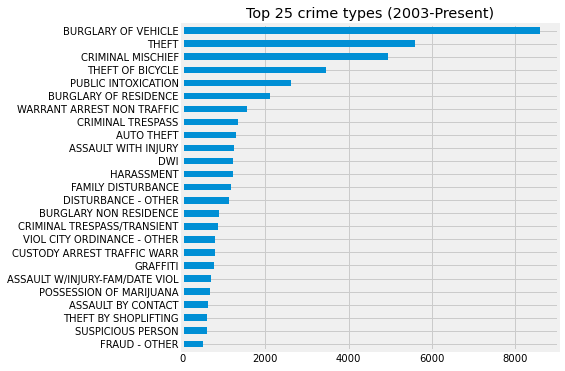

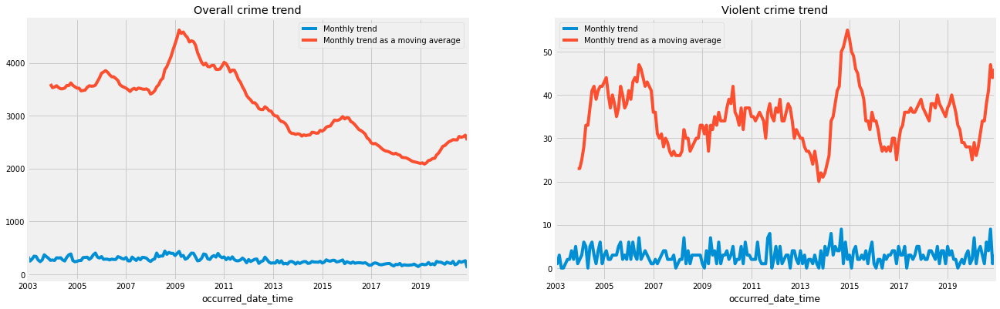

In [5]:
# Top 25 crime types
df.highest_offense_description.value_counts().head(25).sort_values().plot.barh(
    figsize=(6, 6), title="Top 25 crime types (2003-Present)"
)
plt.show()

# Showing trends for overall and violent crime 
fig, axs = plt.subplots(ncols=2, figsize=(20, 6.25))
df.resample("M").size().plot(ax=axs[0])
df.resample("M").size().rolling(12).sum().plot(title="Overall crime trend", ax=axs[0])
axs[0].legend(["Monthly trend", "Monthly trend as a moving average"])
df_viol.resample("M").size().plot(ax=axs[1])
df_viol.resample("M").size().rolling(12).sum().plot(
    title="Violent crime trend", ax=axs[1]
)
axs[1].legend(["Monthly trend", "Monthly trend as a moving average"])
plt.show()

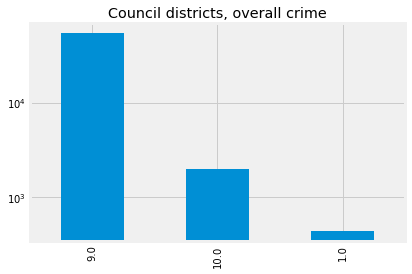

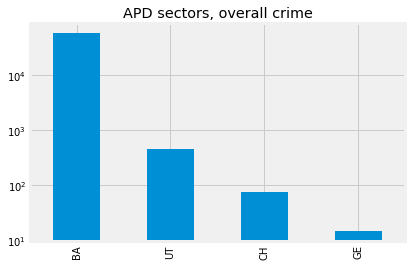

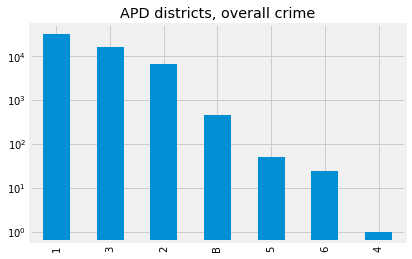

In [6]:
# Showing overall crime rates by council districts, APD districts, and sectors
df.council_district.value_counts().plot.bar(
    title="Council districts, overall crime", logy=True
)
plt.show()

df.apd_sector.value_counts().plot.bar(title="APD sectors, overall crime", logy=True)
plt.show()

df.apd_district.value_counts().plot.bar(title="APD districts, overall crime", logy=True)
plt.show()

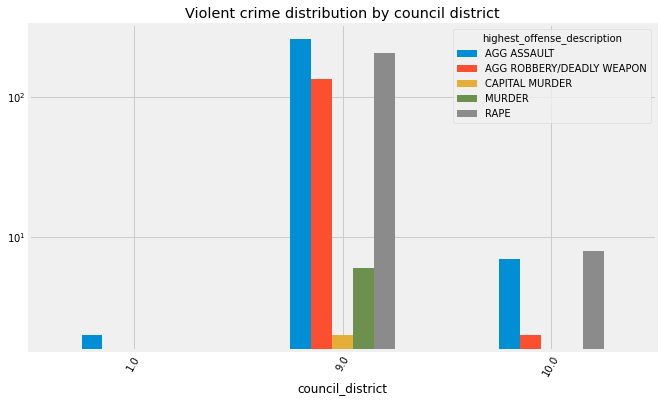

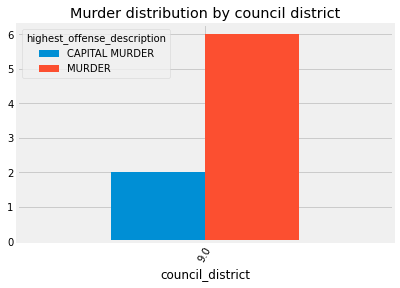

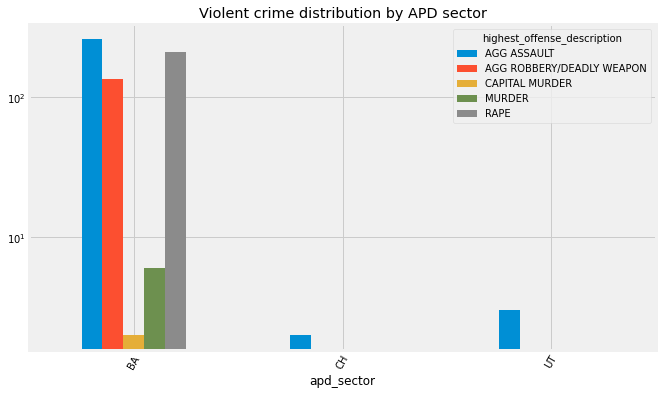

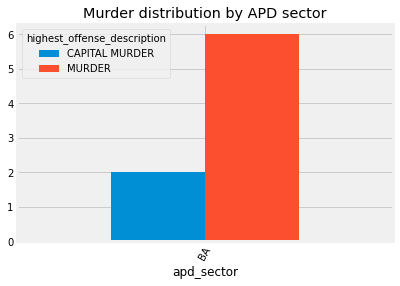

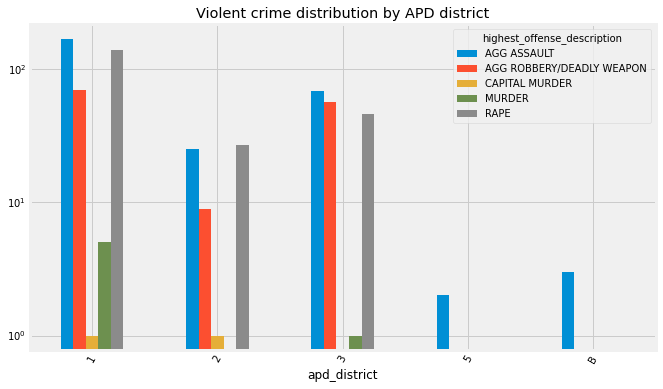

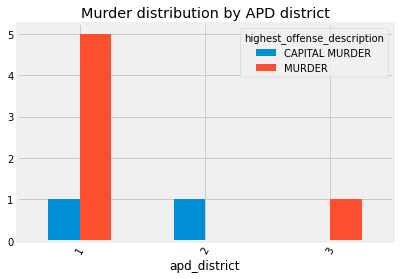

In [7]:
pd.crosstab(df_viol.council_district, df_viol.highest_offense_description).plot.bar(
    rot=60,
    figsize=(10, 6),
    title="Violent crime distribution by council district",
    logy=True,
)
plt.show()

pd.crosstab(
    df_viol_mur.council_district, df_viol_mur.highest_offense_description
).plot.bar(rot=60, title="Murder distribution by council district")
plt.show()

pd.crosstab(df_viol.apd_sector, df_viol.highest_offense_description).plot.bar(
    rot=60, figsize=(10, 6), logy=True, title="Violent crime distribution by APD sector"
)
plt.show()

pd.crosstab(df_viol_mur.apd_sector, df_viol_mur.highest_offense_description).plot.bar(
    rot=60, title="Murder distribution by APD sector"
)
plt.show()

pd.crosstab(df_viol.apd_district, df_viol.highest_offense_description).plot.bar(
    rot=60,
    figsize=(10, 6),
    logy=True,
    title="Violent crime distribution by APD district",
)
plt.show()

pd.crosstab(df_viol_mur.apd_district, df_viol_mur.highest_offense_description).plot.bar(
    rot=60, title="Murder distribution by APD district"
)
plt.show()

highest_offense_description,AGG ASSAULT,AGG ROBBERY/DEADLY WEAPON,CAPITAL MURDER,MURDER,RAPE
location_type,,,,,
ABANDONED/CONDEMNED STRUCTURE,1,0,0,0,0
BANKS / SAVINGS & LOAN,0,5,0,0,0
BAR / NIGHT CLUB,6,0,0,0,1
CHURCH / SYNAGOGUE / TEMPLE / MOSQUE,3,0,0,0,0
COMMERCIAL / OFFICE BUILDING,4,6,0,0,1
CONSTRUCTION SITE,3,0,0,0,1
CONVENIENCE STORE,4,1,0,0,0
DEPARTMENT / DISCOUNT STORE,1,1,0,0,0
DRUG STORE / DR. OFFICE / HOSPITAL,9,4,0,1,11


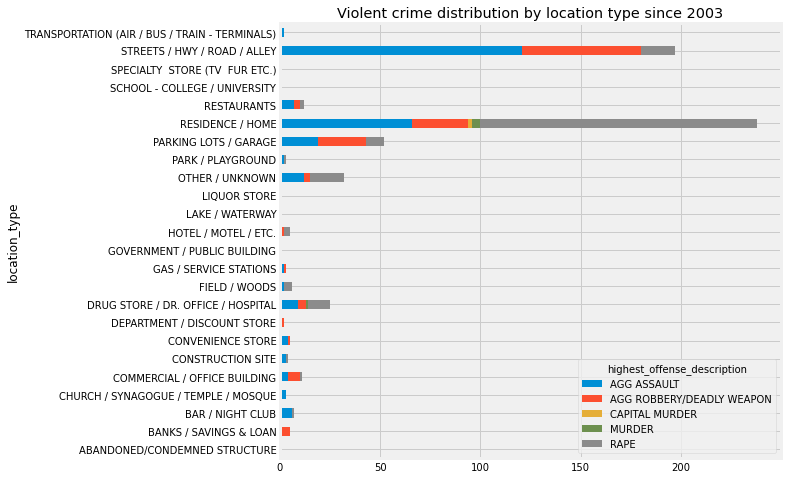

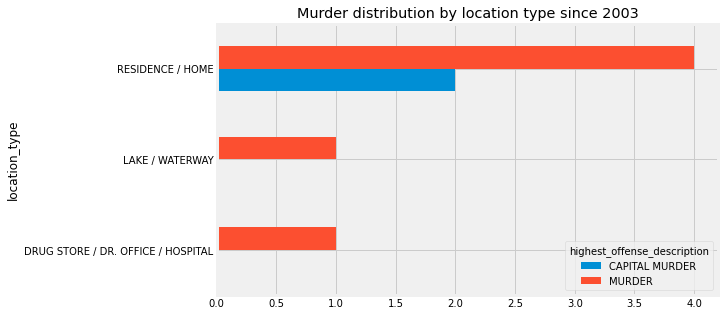

In [8]:
viol_loc = pd.crosstab(df_viol.location_type, df_viol.highest_offense_description)
display(viol_loc)

mur_loc = pd.crosstab(
    df_viol_mur.location_type, df_viol_mur.highest_offense_description
)

viol_loc.plot.barh(
    figsize=(8, 8),
    title="Violent crime distribution by location type since 2003",
    stacked=True,
)
plt.show()

mur_loc.plot.barh(
    figsize=(8, 5), title="Murder distribution by location type since 2003"
)
plt.show()

In [9]:
# Show addresses with 5 or more reported violent crimes
display(df_viol.address.value_counts().head(8))

# Show addresses where murders occurred 
display(df_viol_mur.address.value_counts())

900 BLOCK E 32ND ST          54
919 E 32ND ST                37
2510 LEON ST                  8
600 BLOCK W 26TH ST           7
600 W 26TH ST                 7
2400 BLOCK SAN GABRIEL ST     6
1200 BLOCK W 38TH ST          6
500 BLOCK W 22ND ST           5
Name: address, dtype: int64

3303 LIBERTY ST        1
510 W 26TH ST          1
2812 NUECES ST         1
3102 1/2 KING ST       1
900 E 30TH ST          1
2529 RIO GRANDE ST     1
W 30TH ST / EAST DR    1
904 W 21ST ST          1
Name: address, dtype: int64

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


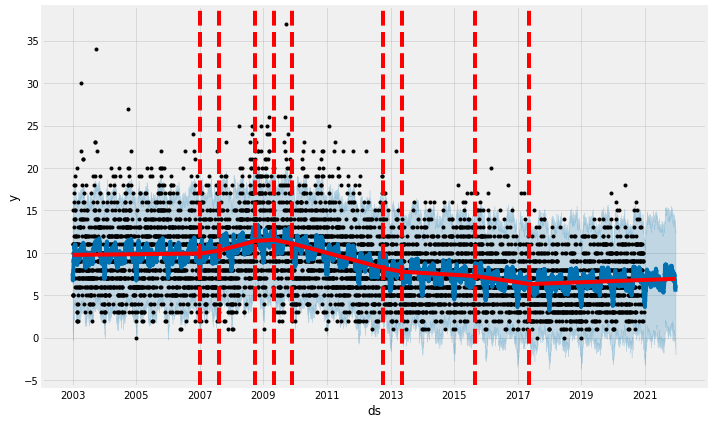

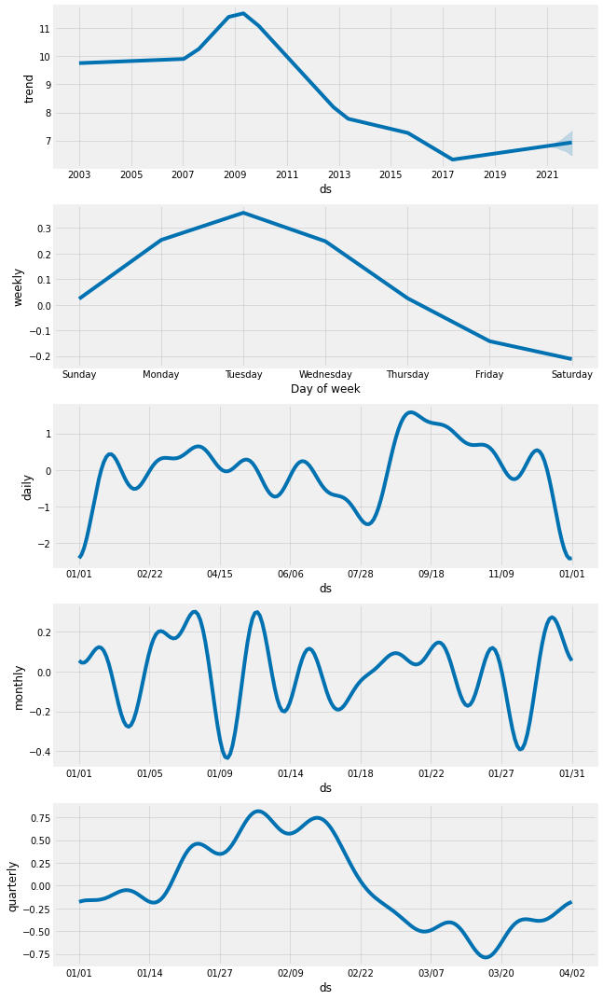

In [10]:
# forecasting for overall crime
df_fbprophet = df

df_m = df_fbprophet.resample("D").size().reset_index()
df_m.columns = ["date", "daily_crime_count"]
df_m_final = df_m.rename(columns={"date": "ds", "daily_crime_count": "y"})

m = Prophet(interval_width=0.95, yearly_seasonality=False)
m.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
m.add_seasonality(name="weekly", period=52, fourier_order=10)
m.add_seasonality(name="daily", period=365, fourier_order=10)
m.fit(df_m_final)

future = m.make_future_dataframe(periods=365, freq="D")

forecast = m.predict(future)

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

fig2 = m.plot_components(forecast)
fig2_1 = plot_plotly(m, forecast)
fig2_1

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


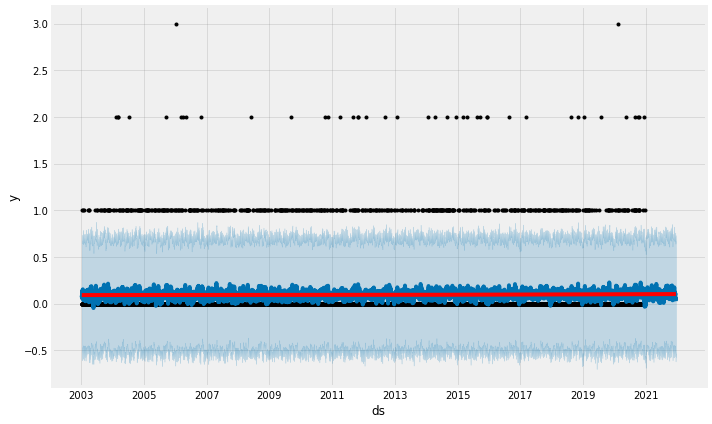

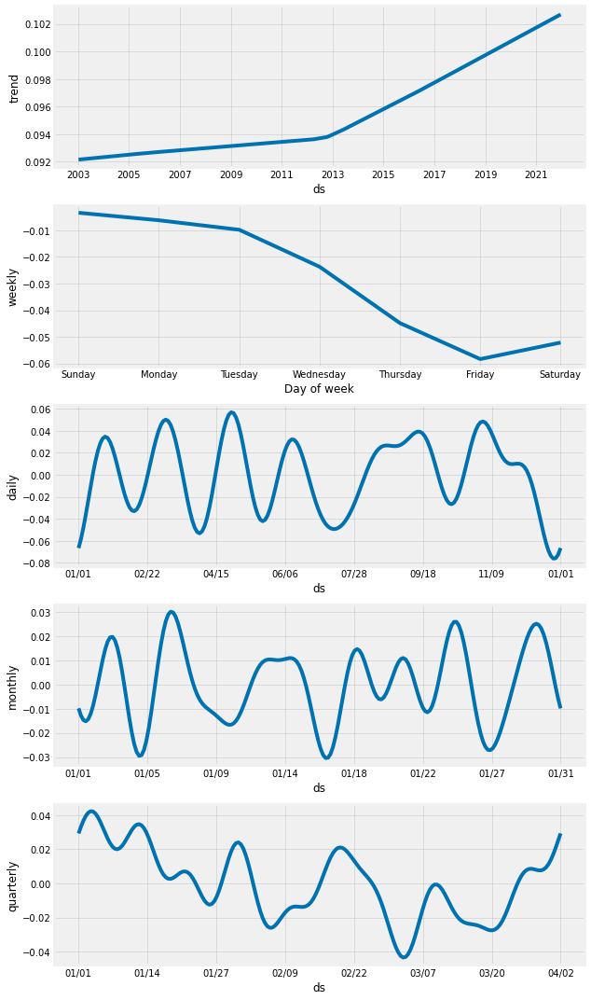

In [11]:
# forecasting for violent crime 
df_viol_fbprophet = df_viol

df_viol_n = df_viol_fbprophet.resample("D").size().reset_index()
df_viol_n.columns = ["date", "daily_crime_count"]
df_viol_n_final = df_viol_n.rename(columns={"date": "ds", "daily_crime_count": "y"})

n = Prophet(interval_width=0.95, yearly_seasonality=False)
n.add_seasonality(name="monthly", period=30.5, fourier_order=10)
n.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
n.add_seasonality(name="weekly", period=52, fourier_order=10)
n.add_seasonality(name="daily", period=365, fourier_order=10)
n.fit(df_viol_n_final)

future = n.make_future_dataframe(periods=365, freq="D")
forecast = n.predict(future)

fig = n.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), n, forecast)

fig3 = n.plot_components(forecast)
fig3_1 = plot_plotly(n, forecast)
fig3_1